In [1]:
import matplotlib.pyplot as plt
import sys
import numpy as np
import skimage
from glob import glob
import os
import time
import pytz
from datetime import datetime, timedelta
import wget
import json
sys.path.insert(1, './scripts')
%matplotlib inline
import pyproj
from helper_functions import *
from PIL import Image, ImageOps
import warnings 
warnings.filterwarnings('ignore') 
from IPython.display import clear_output
import s3fs 
from satpy.writers import get_enhanced_image
import os
import s3fs
from suntime import Sun
from helper_functions import *
import seaborn
from pyorbital import astronomy

from satpy import Scene
from pyresample import create_area_def


1. scale values (1 yr)
2. make series of images to get dave notes next time
3. RGB for low cloud
4. analysis on if over/underclassifying low/med/high - percentage of pixels in each class
5. put in G16 NE in G17 CT product
6. surface level clouds might be difficult - need anlaysis on performance - temporal shift may help

In [2]:
#dt_str = '2024/06/18 15:00'
dt_str = '2025/02/25 22:55'
#dt_str = '2024/07/15 00:00'

#dt_str = '2018/09/25 20:32'
dt = pytz.utc.localize(datetime.strptime(dt_str, '%Y/%m/%d %H:%M')) # convert to datetime object
#dt = pytz.utc.localize(datetime.utcnow()-timedelta(minutes=200))
print(dt)

2025-02-25 22:55:00+00:00


In [3]:
# get list of datetimes when the solar zenith angle for far east and west boundaries are less than 50 deg
def get_sun_up_dts(dt,min_sza=70, west_lon=-125, west_lat=40, east_lon=-110, east_lat=40):
    dt = dt.replace(hour=0, minute=0)
    day_dts = [dt+timedelta(hours=t) for t in range(24)]
    szas_west = np.asarray([astronomy.sun_zenith_angle(day_dt, west_lon, west_lat) for day_dt in day_dts])
    szas_east = np.asarray([astronomy.sun_zenith_angle(day_dt, east_lon, east_lat) for day_dt in day_dts])
    idx_east = list(np.where(szas_east<min_sza)[0])
    idx_west = list(np.where(szas_west<min_sza)[0])
    overlap = list(set(list(idx_east)) & set(list(idx_west)))
    sun_up_dts = [day_dts[idx] for idx in overlap]
    return sun_up_dts
dts = get_sun_up_dts(dt)
print(dts)
dt = dts[-1]
print(dts)

[datetime.datetime(2025, 2, 25, 17, 0, tzinfo=<UTC>), datetime.datetime(2025, 2, 25, 18, 0, tzinfo=<UTC>), datetime.datetime(2025, 2, 25, 19, 0, tzinfo=<UTC>), datetime.datetime(2025, 2, 25, 20, 0, tzinfo=<UTC>), datetime.datetime(2025, 2, 25, 21, 0, tzinfo=<UTC>), datetime.datetime(2025, 2, 25, 22, 0, tzinfo=<UTC>), datetime.datetime(2025, 2, 25, 23, 0, tzinfo=<UTC>)]
[datetime.datetime(2025, 2, 25, 17, 0, tzinfo=<UTC>), datetime.datetime(2025, 2, 25, 18, 0, tzinfo=<UTC>), datetime.datetime(2025, 2, 25, 19, 0, tzinfo=<UTC>), datetime.datetime(2025, 2, 25, 20, 0, tzinfo=<UTC>), datetime.datetime(2025, 2, 25, 21, 0, tzinfo=<UTC>), datetime.datetime(2025, 2, 25, 22, 0, tzinfo=<UTC>), datetime.datetime(2025, 2, 25, 23, 0, tzinfo=<UTC>)]


In [4]:
data_dir = './data/'

def get_first_closest_file(band, fns, dt, sat_num):
    diff = timedelta(days=100)
    matching_band_fns = [s for s in fns if band in s]
    for fn in matching_band_fns:
        s_e = fn.split('_')[3:5]
        start = s_e[0]
        s_dt = datetime.strptime(start[1:-3], '%Y%j%H%M')
        s_dt = pytz.utc.localize(s_dt)
        if diff > abs(s_dt - dt):
            diff = abs(s_dt - dt)
            best_start = start
            best_end = s_e[1]
            best_fn = fn
    #fn_str = 'C{}_G{}_{}_{}'.format(band, sat_num, best_start, best_end)
    fn_str = 'G{}_{}_{}'.format(sat_num, best_start, best_end[:-3])
    return best_fn, fn_str

def get_additional_band_file(band, fn_str, fns):
    best_band_fn = [s for s in fns if band in s and fn_str in s]
    return best_band_fn[0]

def get_closest_file(fns, dt, sat_num, bands):
    use_fns = []
    band_init = 'C'+str(bands[0]).zfill(2)


    best_band_fn, fn_str = get_first_closest_file(band_init, fns, dt, sat_num)
    use_fns.append(best_band_fn)
    for band in bands:
        band = 'C'+str(band).zfill(2)
        best_band_fn = get_additional_band_file(band, fn_str, fns)
        use_fns.append(best_band_fn)
    return use_fns


def get_filelist(dt, fs, lat, lon, sat_num, product, scope, bands):
    hr, dn, yr = get_dt_str(dt)
    full_filelist = fs.ls("noaa-goes{}/{}{}/{}/{}/{}/".format(sat_num, product, scope, yr, dn, hr))
    if sat_num == '17' and len(full_filelist) == 0:
        if yr <= 2018:
            sat_num = '16'
            print("YOU WANTED 17 BUT ITS NOT LAUNCHED")
        elif yr >= 2022:
            sat_num = '18'
        full_filelist = fs.ls("noaa-goes{}/ABI-L1b-Rad{}/{}/{}/{}/".format(sat_num, scope, yr, dn, hr))
    use_fns = get_closest_file(full_filelist, dt, sat_num, bands)
    return use_fns

def get_first_closest_file_mask(fns, dt, sat_num):
    diff = timedelta(days=100)
    for fn in fns:
        s_e = fn.split('_')[3:5]
        start = s_e[0]
        s_dt = datetime.strptime(start[1:-3], '%Y%j%H%M')
        s_dt = pytz.utc.localize(s_dt)
        if diff > abs(s_dt - dt):
            diff = abs(s_dt - dt)
            best_start = start
            best_end = s_e[1]
            best_fn = fn
    #fn_str = 'C{}_G{}_{}_{}'.format(band, sat_num, best_start, best_end)
    fn_str = 'G{}_{}_{}'.format(sat_num, best_start, best_end[:-3])
    return best_fn

#def get_filelist_mask(dt, fs, lat, lon, sat_num, product="ABI-L2-ACTP", scope="C"):
#def get_filelist_mask(dt, fs, lat, lon, sat_num, product="ABI-L2-AOD", scope="F"):
#def get_filelist_mask(dt, fs, lat, lon, sat_num, product="ABI-L2-ADP", scope="F"):
def get_filelist_mask(dt, fs, lat, lon, sat_num, product="ABI-L2-ACHT", scope="F"):
    hr, dn, yr = get_dt_str(dt)
    full_filelist = fs.ls("noaa-goes{}/{}{}/{}/{}/{}/".format(sat_num, product, scope, yr, dn, hr))
    use_fns = get_first_closest_file_mask(full_filelist, dt, sat_num)
    return use_fns

def download_goes(dt, lat=None, lon=None, sat_num='16', product='ABI-L1b-Rad', scope='F',bands=list(range(1,4))):
    goes_dir = data_dir + 'goes/'
    fs = s3fs.S3FileSystem(anon=True)

    use_fns = get_filelist(dt, fs, lat, lon, sat_num, product, scope, bands)
    use_fns_mask = get_filelist_mask(dt, fs, lat, lon, sat_num)
    use_fns.append(use_fns_mask)
    file_locs = []
    print(use_fns_mask)
    print(use_fns)
    for file_path in use_fns:
        fn = file_path.split('/')[-1]
        dl_loc = goes_dir+fn
        file_locs.append(dl_loc)
        if os.path.exists(dl_loc):
            print("{} already exists".format(fn))
        else:
            print('downloading {}'.format(fn))
            fs.get(file_path, dl_loc)
    if len(file_locs) > 0:
        return file_locs
    else:
        print('ERROR NO FILES FOUND FOR TIME REQUESTED: ', dt)


In [5]:
sat_fns = download_goes(dt, sat_num='16', bands=list(range(14,17)))
fn_head = sat_fns[0].split('C14_')[-1].split('.')[0].split('_c2')[0]

noaa-goes16/ABI-L2-ACHTF/2025/056/23/OR_ABI-L2-ACHTF-M6_G16_s20250562300206_e20250562309514_c20250562313140.nc
['noaa-goes16/ABI-L1b-RadF/2025/056/23/OR_ABI-L1b-RadF-M6C14_G16_s20250562300206_e20250562309514_c20250562309577.nc', 'noaa-goes16/ABI-L1b-RadF/2025/056/23/OR_ABI-L1b-RadF-M6C14_G16_s20250562300206_e20250562309514_c20250562309577.nc', 'noaa-goes16/ABI-L1b-RadF/2025/056/23/OR_ABI-L1b-RadF-M6C15_G16_s20250562300206_e20250562309520_c20250562309567.nc', 'noaa-goes16/ABI-L1b-RadF/2025/056/23/OR_ABI-L1b-RadF-M6C16_G16_s20250562300206_e20250562309526_c20250562309570.nc', 'noaa-goes16/ABI-L2-ACHTF/2025/056/23/OR_ABI-L2-ACHTF-M6_G16_s20250562300206_e20250562309514_c20250562313140.nc']
OR_ABI-L1b-RadF-M6C14_G16_s20250562300206_e20250562309514_c20250562309577.nc already exists
OR_ABI-L1b-RadF-M6C14_G16_s20250562300206_e20250562309514_c20250562309577.nc already exists
OR_ABI-L1b-RadF-M6C15_G16_s20250562300206_e20250562309520_c20250562309567.nc already exists
OR_ABI-L1b-RadF-M6C16_G16_s202

In [6]:
sat_fns_18 = download_goes(dt, sat_num='18', bands=list(range(14,17)))
fn_head_18 = sat_fns[0].split('C14_')[-1].split('.')[0].split('_c2')[0]

noaa-goes18/ABI-L2-ACHTF/2025/056/23/OR_ABI-L2-ACHTF-M6_G18_s20250562300216_e20250562309524_c20250562312255.nc
['noaa-goes18/ABI-L1b-RadF/2025/056/23/OR_ABI-L1b-RadF-M6C14_G18_s20250562300216_e20250562309524_c20250562309588.nc', 'noaa-goes18/ABI-L1b-RadF/2025/056/23/OR_ABI-L1b-RadF-M6C14_G18_s20250562300216_e20250562309524_c20250562309588.nc', 'noaa-goes18/ABI-L1b-RadF/2025/056/23/OR_ABI-L1b-RadF-M6C15_G18_s20250562300216_e20250562309529_c20250562309571.nc', 'noaa-goes18/ABI-L1b-RadF/2025/056/23/OR_ABI-L1b-RadF-M6C16_G18_s20250562300216_e20250562309536_c20250562309584.nc', 'noaa-goes18/ABI-L2-ACHTF/2025/056/23/OR_ABI-L2-ACHTF-M6_G18_s20250562300216_e20250562309524_c20250562312255.nc']
OR_ABI-L1b-RadF-M6C14_G18_s20250562300216_e20250562309524_c20250562309588.nc already exists
OR_ABI-L1b-RadF-M6C14_G18_s20250562300216_e20250562309524_c20250562309588.nc already exists
OR_ABI-L1b-RadF-M6C15_G18_s20250562300216_e20250562309529_c20250562309571.nc already exists
OR_ABI-L1b-RadF-M6C16_G18_s202

In [7]:
print(sat_fns)

['./data/goes/OR_ABI-L1b-RadF-M6C14_G16_s20250562300206_e20250562309514_c20250562309577.nc', './data/goes/OR_ABI-L1b-RadF-M6C14_G16_s20250562300206_e20250562309514_c20250562309577.nc', './data/goes/OR_ABI-L1b-RadF-M6C15_G16_s20250562300206_e20250562309520_c20250562309567.nc', './data/goes/OR_ABI-L1b-RadF-M6C16_G16_s20250562300206_e20250562309526_c20250562309570.nc', './data/goes/OR_ABI-L2-ACHTF-M6_G16_s20250562300206_e20250562309514_c20250562313140.nc']


In [8]:
#composite = ['cimss_true_color_sunz_rayleigh'] # define the true color composite
import cartopy.crs as ccrs
def get_proj():
    
    lcc_proj = ccrs.LambertConformal(central_longitude=262.5,
                                     central_latitude=38.5,
                                     standard_parallels=(38.5, 38.5),
                                     globe=ccrs.Globe(semimajor_axis=6371229,
                                                      semiminor_axis=6371229))
    return lcc_proj
x0 = -2.4e6
y0 = -2.112e6
x1 = 1.696e6
y1 = 1.984e6
extent = [x0, y0, x1, y1]
#extent=[-2.4e6, -1.5e6, 2.3e6, 1.4e6] # extent for CONUS in meters for LCC projection

In [9]:
from satpy import Scene
from pyresample import create_area_def
composite = ["cimss_true_color_sunz_rayleigh"]
# get the Satpy Scene object
bands = ['C14', 'C15', 'C16']
def get_scn(fns, to_load, extent, res=3000, proj=get_proj(), reader='abi_l1b', print_info=False):
    scn = Scene(reader=reader, filenames=fns)    
    scn.load(to_load, generate=False)
    my_area = create_area_def(area_id='my_area',
                              projection=proj,
                              resolution=res,
                              area_extent=extent
                              )
    if print_info:
        print("Available channels in the Scene object:\n", scn.available_dataset_names())
        print("\nAvailable composites:\n", scn.available_composite_names())
        print("\nArea definitition:\n",my_area)    
    new_scn = scn.resample(my_area) # resamples datasets and resturns a new scene object
    return new_scn
    
res = 2000 # 5km resolution
scn = get_scn(sat_fns[:-1], bands, extent, res, print_info=True) # get satpy scn object
conus_crs = scn['C14'].attrs['area'].to_cartopy_crs() # the crs object will have the area extent for plotting

mask = ['TEMP']

temp_scn = get_scn([sat_fns[-1]], mask, extent, res, reader='abi_l2_nc') # get satpy scn object
scn_18 = get_scn(sat_fns_18[:-1], bands, extent, res) # get satpy scn object

temp_scn_18 = get_scn([sat_fns_18[-1]], mask, extent, res, reader='abi_l2_nc') # get satpy scn object



Available channels in the Scene object:
 ['C14', 'C15', 'C16']

Available composites:
 ['highlight_C14', 'ir108_3d', 'ir_cloud_day']

Area definitition:
 Area ID: my_area
Description: my_area
Projection: {'R': '6371229', 'lat_0': '38.5', 'lat_1': '38.5', 'lat_2': '38.5', 'lon_0': '262.5', 'no_defs': 'None', 'proj': 'lcc', 'type': 'crs', 'units': 'm', 'x_0': '0', 'y_0': '0'}
Number of columns: 2048
Number of rows: 2048
Area extent: (-2400000.0, -2112000.0, 1696000.0, 1984000.0)
Available channels in the Scene object:
 ['TEMP']

Available composites:
 []

Area definitition:
 Area ID: my_area
Description: my_area
Projection: {'R': '6371229', 'lat_0': '38.5', 'lat_1': '38.5', 'lat_2': '38.5', 'lon_0': '262.5', 'no_defs': 'None', 'proj': 'lcc', 'type': 'crs', 'units': 'm', 'x_0': '0', 'y_0': '0'}
Number of columns: 2048
Number of rows: 2048
Area extent: (-2400000.0, -2112000.0, 1696000.0, 1984000.0)
Available channels in the Scene object:
 ['C14', 'C15', 'C16']

Available composites:
 ['hig

In [13]:
temp = temp_scn['TEMP'].compute().data
temp[np.isnan(temp)] = 0
temp[(temp<233)& (temp>0)]= 3 # high
temp[(temp>253)] = 1 # low
temp[(temp>=233) & (temp<=253)] = 2 # mid
temp = np.array(temp, dtype=np.int8)

In [12]:

temp0 = temp_scn['TEMP'].compute().data
temp0[np.isnan(temp0)] = 0

temp0[(temp0>290)] = 290 # low




In [14]:
temp1 = temp_scn['TEMP'].compute().data
temp1[np.isnan(temp1)] = 0
temp1[(temp1<233)& (temp1>0)]= 3 # high
temp1[(temp1>268)] = 1 # low
temp1[(temp1>=233) & (temp1<=268)] = 2 # mid
temp1 = np.array(temp1, dtype=np.int8)

In [11]:
print(temp)

[[2 2 0 ... 2 2 2]
 [0 2 0 ... 2 2 2]
 [2 2 0 ... 2 2 2]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [3 3 1 ... 1 1 1]]


In [12]:
def normalize(data):
    return (data - np.nanmin(data)) / (np.nanmax(data) - np.nanmin(data))
def get_IR(scn,bands):
    C14 = scn[bands[0]].compute().data
    C15 = scn[bands[1]].compute().data
    C16 = scn[bands[2]].compute().data
    IR = np.dstack([C14, C15, C16])
    #RGB = np.einsum('ijk->jki', RGB)
    IR[np.isnan(IR)] = 0
    return IR
RGB = get_IR(scn, bands) # from the scene object, extract RGB data for plotting
RGB = normalize(RGB)

In [13]:
RGB.shape

(2048, 2048, 3)

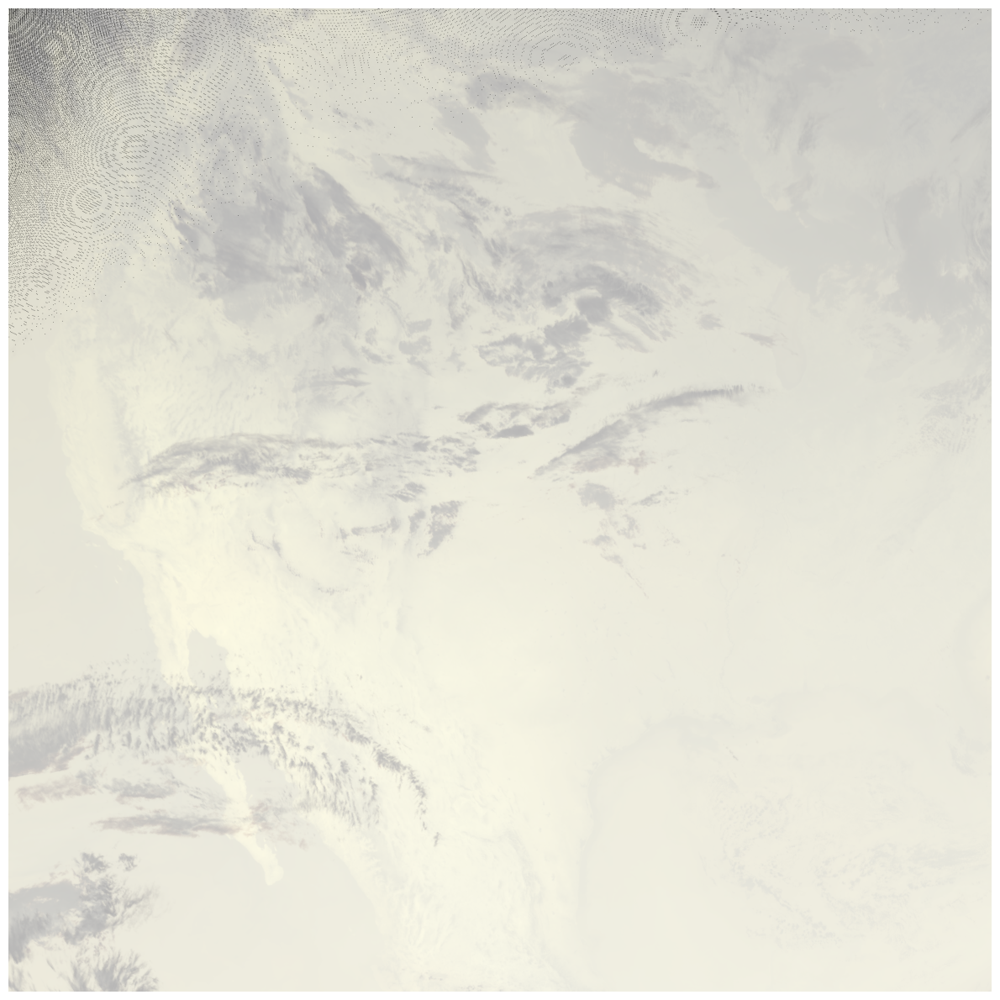

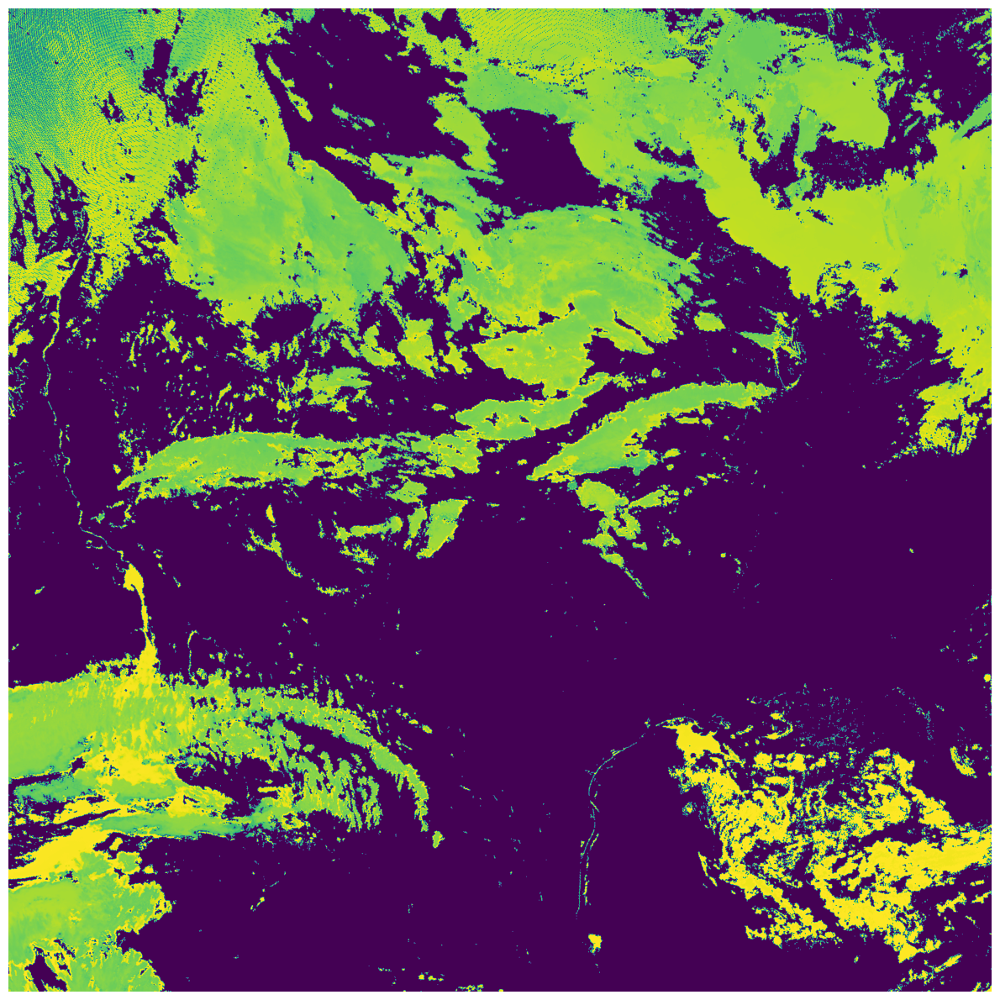

263 K


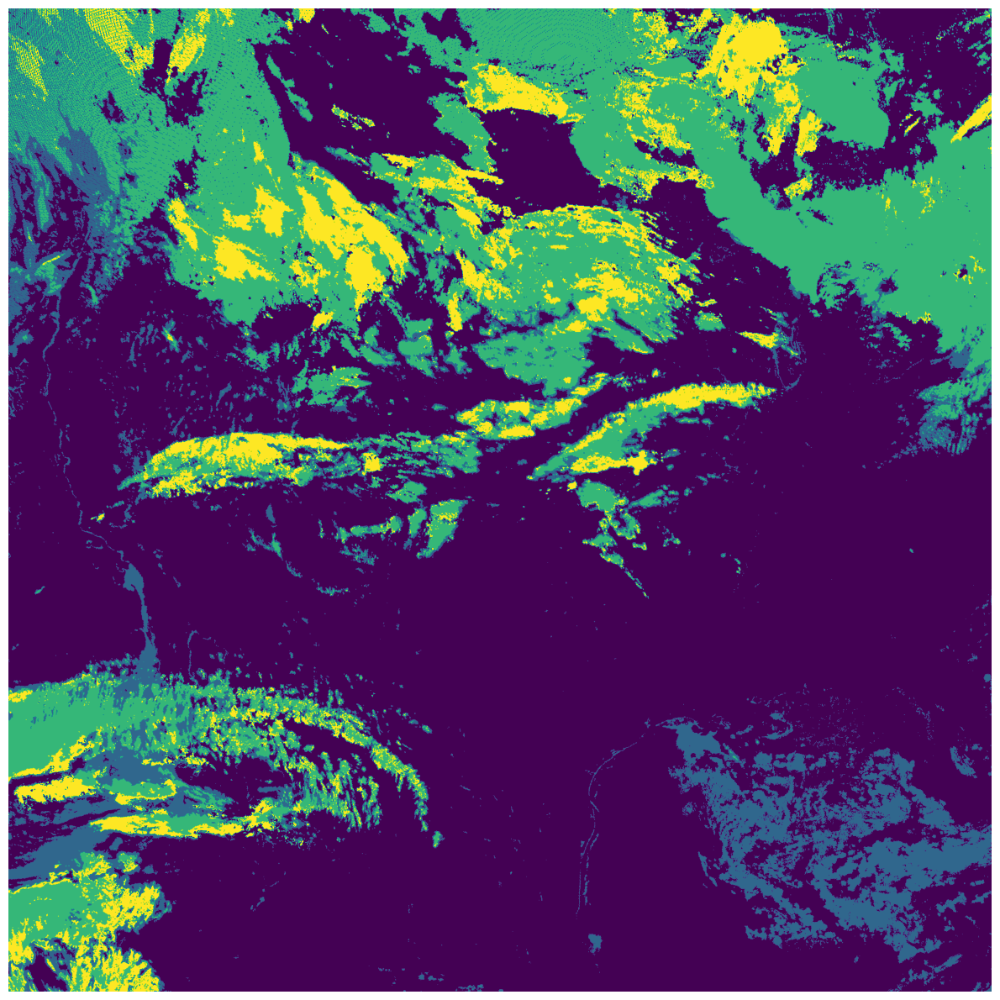

253 K


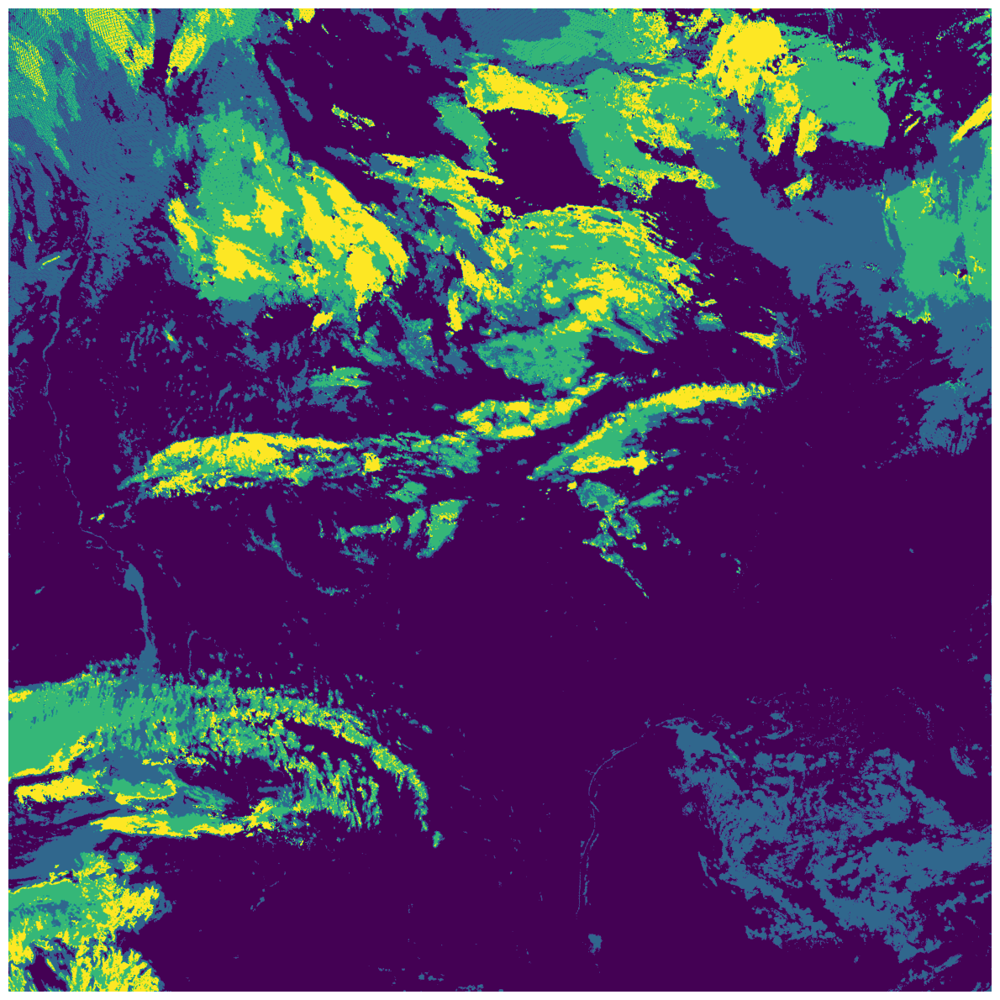

In [14]:

def plot_CONUS(data, crs, name):
    #states = get_states(crs) # ./scripts/helper_functions.py
    fig = plt.figure(figsize=(15, 12))
    ax = plt.axes(projection=crs)
    plt.imshow(data, transform=crs, extent=crs.bounds, origin='upper')
    #states.boundary.plot(ax=ax, edgecolor='white', linewidth=.25)
    plt.axis('off')
    fig.tight_layout()
    #plt.savefig('{}.png'.format(name))
    plt.show()
plot_CONUS(RGB, conus_crs, 'rgb')

plot_CONUS(temp0, conus_crs, 'temp')
print('263 K')
plot_CONUS(temp1, conus_crs, 'temp')
print('253 K')
plot_CONUS(temp, conus_crs, 'temp')

In [15]:
print(np.unique(temp))
print(temp.shape)

[0 1 2 3]
(2048, 2048)


In [16]:
def get_one_hot(binary, n_cats):
    k = np.take(np.eye(n_cats), binary, axis=1)
    k = k[1:,:,:]
    k = np.einsum('ijk->jki', k)
    return k
n_cats = 4
one_hot_mask = get_one_hot(temp, n_cats) # from the scene object, extract RGB data for plotting
one_hot_mask.shape

(2048, 2048, 3)

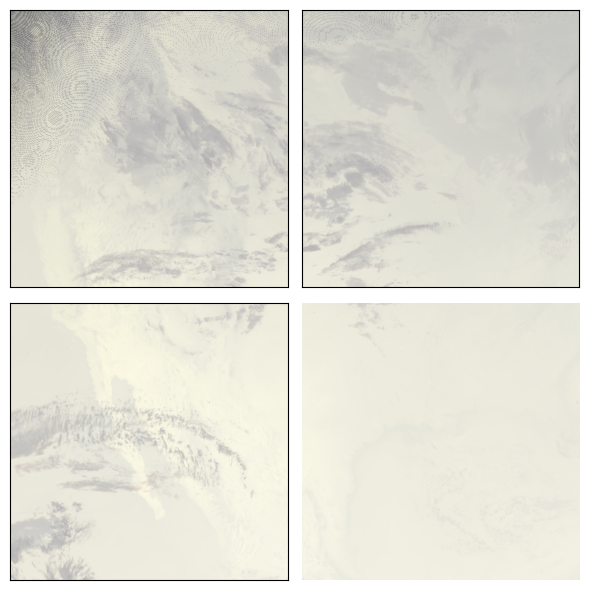

In [17]:
def plot_data(data):
    fig = plt.figure(figsize=(5, 5))
    plt.imshow(data)    
    plt.axis('off')
    fig.tight_layout()
    plt.show()    

def split_img(full_image, img_size=1024):
    n_row = int(full_image.shape[0]/img_size)
    n_col = int(full_image.shape[1]/img_size)
    full_image = full_image[0:int(n_row*img_size),0:int(n_col*img_size)][:]
    fig, ax = plt.subplots(n_row, n_col, figsize=(n_col*3,n_row*3))
    for row in range(n_row):
        for col in range(n_col):
            ax[row][col].imshow(full_image[int(row*img_size):int((row+1)*img_size),int(col*img_size):int((col+1)*img_size)][:])
            ax[row][col].set_yticks([])
            ax[row][col].set_xticks([])
    plt.axis('off')
    fig.tight_layout()
    plt.show()
split_img(RGB)

In [18]:
encoded_cats = np.zeros((2048,2048,4))
encoded_cats[:, :, 1:] = one_hot_mask
cats = np.argmax(encoded_cats, axis=2)


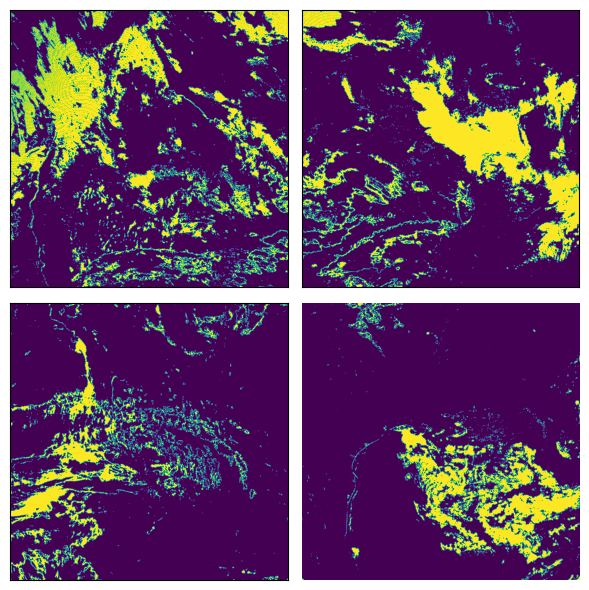

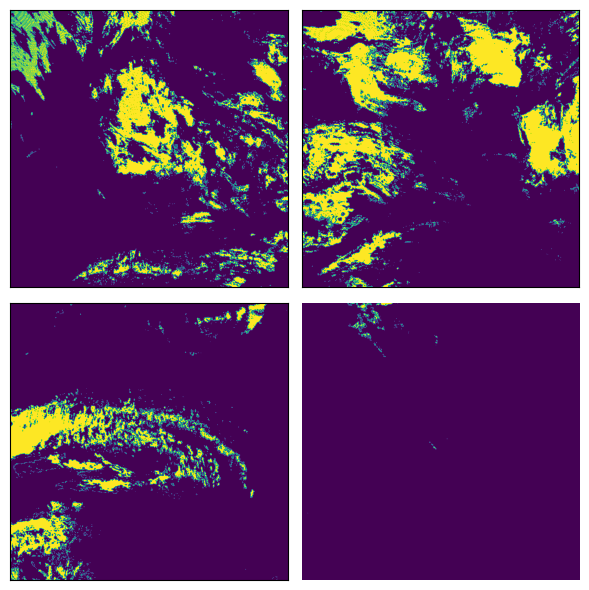

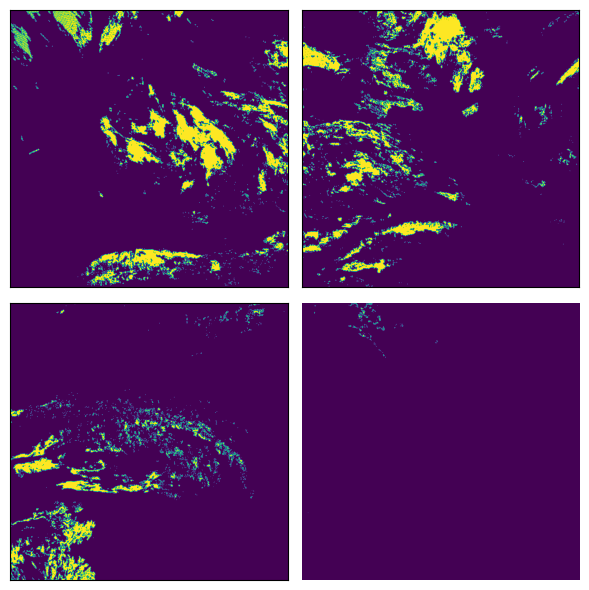

In [20]:

split_img(one_hot_mask[:,:,0])
split_img(one_hot_mask[:,:,1])
split_img(one_hot_mask[:,:,2])

In [21]:
def split_and_save(full_image, full_truth, full_coords, fn_head, img_size=1024):
    yr = fn_head.split('s')[1][0:4]
    n_row = int(full_image.shape[0]/img_size)
    n_col = int(full_image.shape[1]/img_size)
    full_image = full_image[0:int(n_row*img_size),0:int(n_col*img_size)][:]
    full_truth = full_truth[0:int(n_row*img_size),0:int(n_col*img_size)][:]
    full_coords = full_coords[0:int(n_row*img_size),0:int(n_col*img_size)][:]
    fn_list = []
    for row in range(n_row):
        for col in range(n_col):
            data = full_image[int(row*img_size):int((row+1)*img_size),int(col*img_size):int((col+1)*img_size)][:]
            truth = full_truth[int(row*img_size):int((row+1)*img_size),int(col*img_size):int((col+1)*img_size)][:]
            coords = full_coords[int(row*img_size):int((row+1)*img_size),int(col*img_size):int((col+1)*img_size)][:]
            fn = '{}_{}_{}.tif'.format(fn_head, row, col)
            center_lat = coords[int(img_size/2)][int(img_size/2)][0]
            center_lon = coords[int(img_size/2)][int(img_size/2)][1]
            density = "Light"
            save_loc = "./cloud_data/"
            skimage.io.imsave('{}data/{}/{}'.format(save_loc, yr, fn), data)
            skimage.io.imsave('{}truth/{}/{}'.format(save_loc, yr, fn), truth)
            #skimage.io.imsave('./data/coords/{}/{}/{}'.format(yr, density, fn), coords)
            fn_list.append(fn)

    return fn_list
lons, lats = scn['C14'].attrs['area'].get_lonlats()
lat_lon = np.dstack([lats, lons])
tif_fns = split_and_save(RGB, one_hot_mask, lat_lon, fn_head)

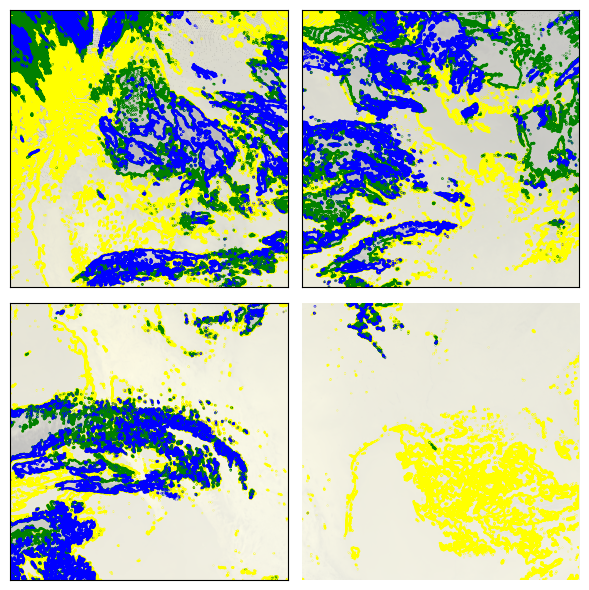

In [22]:
def get_mesh(num_pixels):
    x = np.linspace(0,num_pixels-1,num_pixels)
    y = np.linspace(0,num_pixels-1,num_pixels)
    X, Y = np.meshgrid(x,y)
    return X,Y

def plot_all(fn_head, data_loc='./cloud_data/'):
    n_row = 2
    n_col = 2
    fig, ax = plt.subplots(n_row, n_col, figsize=(n_col*3,n_row*3))
    for row in range(n_row):
        for col in range(n_col):
            data_fn = glob("{}data/*/{}_{}_{}.tif".format(data_loc,fn_head,row,col))[0]
            RGB = skimage.io.imread(data_fn, plugin='tifffile')
            num_pixels = RGB.shape[1]
            X, Y = get_mesh(num_pixels)
            truth_fn = glob("{}truth/*/{}_{}_{}.tif".format(data_loc,fn_head,row,col))[0]
            truths = skimage.io.imread(truth_fn, plugin='tifffile')
            ax[row][col].contour(X,Y,truths[:,:,0],levels =[.99], colors = 'yellow')
            ax[row][col].contour(X,Y,truths[:,:,1],levels =[.99], colors = 'green')
            ax[row][col].contour(X,Y,truths[:,:,2],levels =[.99], colors = 'blue')
            ax[row][col].imshow(RGB)
            ax[row][col].set_yticks([])
            ax[row][col].set_xticks([])
    plt.axis('off')
    fig.tight_layout()
    plt.show()
plot_all(fn_head)

In [23]:
import matplotlib.pyplot as plt
from glob import glob
import numpy as np
import skimage
from datetime import datetime

def get_lat_lon(fn, data_loc):
    coords_fn = glob(data_loc + "coords/*/*/" + fn)[0]
    lat_lon = skimage.io.imread(coords_fn, plugin='tifffile')
    lat = lat_lon[:,:,0]
    lon = lat_lon[:,:,1]
    return lat[::63,0], lon[-1,::63]

def get_data(fn, data_loc="./sample_data/"):
    data_fn = glob(data_loc + "data/*/" + fn)[0]
    truth_fn = glob(data_loc + "truth/*/" + fn)[0]
    RGB = skimage.io.imread(data_fn, plugin='tifffile')
    truths = skimage.io.imread(truth_fn, plugin='tifffile')
    #lat, lon = get_lat_lon(fn, data_loc)
    return RGB, truths

def get_datetime_from_fn(fn):
    start = fn.split('_')[1][1:-1]
    start_dt = datetime.strptime(start, '%Y%j%H%M%S')
    start_readable = start_dt.strftime('%Y/%m/%d %H:%M UTC')
    return start_readable

def get_mesh(num_pixels):
    x = np.linspace(0,num_pixels-1,num_pixels)
    y = np.linspace(0,num_pixels-1,num_pixels)
    X, Y = np.meshgrid(x,y)
    return X,Y

def plot_densities_from_processed_data(fn, data_loc="./sample_data/", close=False, save=False):
    RGB, truths= get_data(fn, data_loc)
    num_pixels = RGB.shape[1]
    X, Y = get_mesh(num_pixels)
    colors = ['blue', 'green', 'yellow']
    plt.figure(figsize=(8, 6),dpi=100)

    plt.imshow(RGB)
    for idx in reversed(range(3)):
        plt.contour(X,Y,truths[:,:,idx],levels =[.99],colors=[colors[idx]])
    plt.tight_layout(pad=0)
    #plt.yticks(np.linspace(0,255,5), np.round(lat,2), fontsize=12)
    #plt.ylabel('latitude (degrees)', fontsize=16)
    #plt.xticks(np.linspace(0,255,5), np.round(lon,2), fontsize=12)
    #plt.xlabel('longitude (degrees)', fontsize=16)
    plt.title(get_datetime_from_fn(fn), fontsize=18)
    plt.tight_layout(pad=0)#, h_pad=-.5)
    if save:
        plt.savefig('densities.png', dpi=300)
    plt.show()
    if close:
        plt.close()


G16_s20250562300206_e20250562309514_0_0.tif


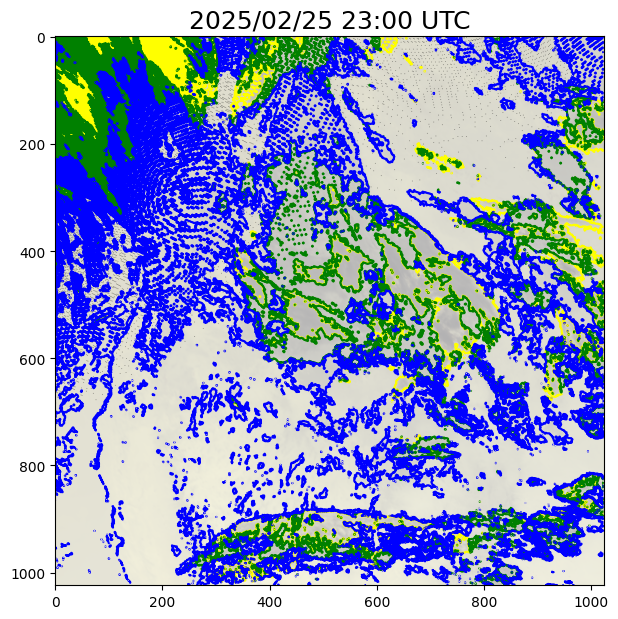

press enter for next, type anything to end: x


In [24]:
#from plot_tifs import plot_densities_from_processed_data # code located in /scripts/plot_tifs.py
%matplotlib inline

def cycle_through_imagery(data_loc="./cloud_data/"):
    for fn in tif_fns:
        print(fn)
        plot_densities_from_processed_data(fn, data_loc, close=True)
        x = input('press enter for next, type anything to end:')
        if x != '':
            break
        clear_output()
cycle_through_imagery()

In [25]:
import segmentation_models_pytorch as smp
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
import pickle
from torchvision import transforms
import torch.nn as nn
from today_list import data_dict_from_tif_filelist

In [26]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")                                                                                                                        
print(device)

cpu


In [27]:
print(tif_fns)

['G16_s20250562300206_e20250562309514_0_0.tif', 'G16_s20250562300206_e20250562309514_0_1.tif', 'G16_s20250562300206_e20250562309514_1_0.tif', 'G16_s20250562300206_e20250562309514_1_1.tif']


In [28]:
def data_dict_from_tif_filelist(fns, data_dir='./cloud_data/'):
    truth_file_list = []
    data_file_list = []
    for fn in fns:
        truth_file_loc = glob(data_dir +'truth/*/'+fn)
        data_file_loc = glob(data_dir  +'data/*/'+fn)

        truth_file_list.extend(truth_file_loc)
        data_file_list.extend(data_file_loc)
    data_dict = {'test': {'truth': truth_file_list, 'data': data_file_list}}
    return data_dict
data_dict = data_dict_from_tif_filelist(tif_fns)
print(json.dumps(data_dict, indent=4))

{
    "test": {
        "truth": [
            "./cloud_data/truth/2025/G16_s20250562300206_e20250562309514_0_0.tif",
            "./cloud_data/truth/2025/G16_s20250562300206_e20250562309514_0_1.tif",
            "./cloud_data/truth/2025/G16_s20250562300206_e20250562309514_1_0.tif",
            "./cloud_data/truth/2025/G16_s20250562300206_e20250562309514_1_1.tif"
        ],
        "data": [
            "./cloud_data/data/2025/G16_s20250562300206_e20250562309514_0_0.tif",
            "./cloud_data/data/2025/G16_s20250562300206_e20250562309514_0_1.tif",
            "./cloud_data/data/2025/G16_s20250562300206_e20250562309514_1_0.tif",
            "./cloud_data/data/2025/G16_s20250562300206_e20250562309514_1_1.tif"
        ]
    }
}


In [29]:
class SmokeDataset(Dataset):
    def __init__(self, data_dict, transform=None):
        self.data_fns = data_dict
        self.transform = transform
    def __len__(self):
        return len(self.data_fns['data'])
    def __getitem__(self, idx):
        data_fn = self.data_fns['data'][idx]
        truth_fn = self.data_fns['truth'][idx]
        data_img = skimage.io.imread(data_fn, plugin='tifffile')
        truth_img = skimage.io.imread(truth_fn, plugin='tifffile')
        data_tensor = self.transform(data_img)
        truth_tensor = self.transform(truth_img)
        truth_tensor = truth_tensor.type(torch.float)
        return data_tensor, truth_tensor, data_fn.split('/')[-1]
        
data_transforms = transforms.Compose([transforms.ToTensor()])
test_set = SmokeDataset(data_dict['test'], data_transforms)
test_loader = torch.utils.data.DataLoader(dataset=test_set, batch_size=1, shuffle=False, drop_last=True)
print('there are {} items in the dataset'.format(len(test_loader)))

there are 4 items in the dataset


In [30]:
from collections import OrderedDict

ckpt_pth = '/home/rey/projects/Cloud_Top_Temp/deep_learning/models/DeepLabV3Plus_exp0_1739398821.pth'
ckpt_dst = 'DeepLabV3Plus_test.pth'

def remove_module(ckpt):
    new_state_dict = OrderedDict()
    for k, v in ckpt.items():
        name = k[7:] # remove module.
        new_state_dict[name] = v
    return new_state_dict

ckpt = torch.load(ckpt_pth, map_location=torch.device('cpu'))
ckpt['model_state_dict'] = remove_module(ckpt['model_state_dict'])
torch.save(ckpt, ckpt_dst)

In [31]:
model = smp.DeepLabV3Plus(                                                                                                                                   
        encoder_name="timm-efficientnet-b0",                                                                                                                 
        encoder_weights=None, # use `imagenet` pre-trained weights for encoder initialization                                                          
        in_channels=3, # model input channels                                                                                                                
        classes=3, # model output channels                                                                                                                   
)   
chkpt_pth = 'DeepLabV3Plus_test.pth'
chkpt = torch.load(chkpt_pth, map_location=torch.device('cpu'))
model = model.to(device)
model.load_state_dict(chkpt['model_state_dict'])
model.eval()
torch.set_grad_enabled(False)


In [32]:
def compute_iou(preds, truths):
    true = truths
    pred = preds
    intersection = (pred + true == 2).sum()
    union = (pred + true >= 1).sum()
    iou = intersection / union
    print('{} IoU'.format(np.round(iou,2)))

In [33]:
def get_cats(one_hot_mask, size = 1024):
    encoded_cats = np.zeros((1024,1024,4))
    encoded_cats[:, :, 1:] = one_hot_mask
    return np.argmax(encoded_cats, axis=2)
def plot_results(IR, truths, preds):

    fig, ax = plt.subplots(1, 3, figsize=(16,8))

    ax[0].imshow(IR)
    ax[1].imshow(preds)
    ax[2].imshow(truths)

    ax[0].set_yticks([])
    ax[0].set_xticks([])
    ax[1].set_yticks([])
    ax[1].set_xticks([])
    ax[2].set_yticks([])
    ax[2].set_xticks([])
    ax[0].set_title('IR C14, C15, C16',fontsize=18)
    ax[1].set_title('model prediction',fontsize=18)
    ax[2].set_title('GOES Cloud Top Temp Product',fontsize=18)

    #plt.suptitle(get_datetime_from_fn(fn), fontsize=18)

    plt.subplots_adjust(wspace=0)
    #if save_fig:
    #    plt.savefig('./figures/results.png', dpi=300)
    #plt.show()
                             
    fig.tight_layout()
    plt.show()    

                    
def plot_test_results(data, labels, pred, fn, save_fig = False, data_loc="./cloud_data/"):
    IR = np.dstack([data[0], data[1], data[2]])
    preds = np.dstack([pred[0], pred[1], pred[2]])
    cat_preds = get_cats(preds)
    truths = np.dstack([labels[0], labels[1], labels[2]])
    cat_truths = get_cats(truths)

    plot_results(IR, cat_truths, cat_preds)


G16_s20250562300206_e20250562309514_0_0.tif


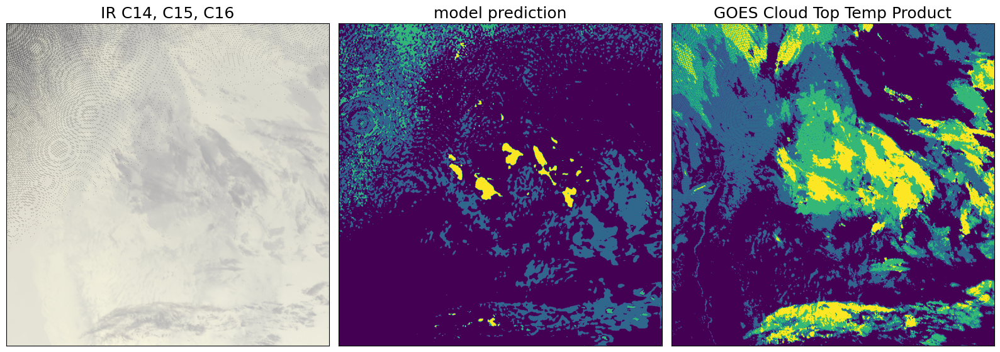

0.1599999964237213 IoU
---
G16_s20250562300206_e20250562309514_0_1.tif


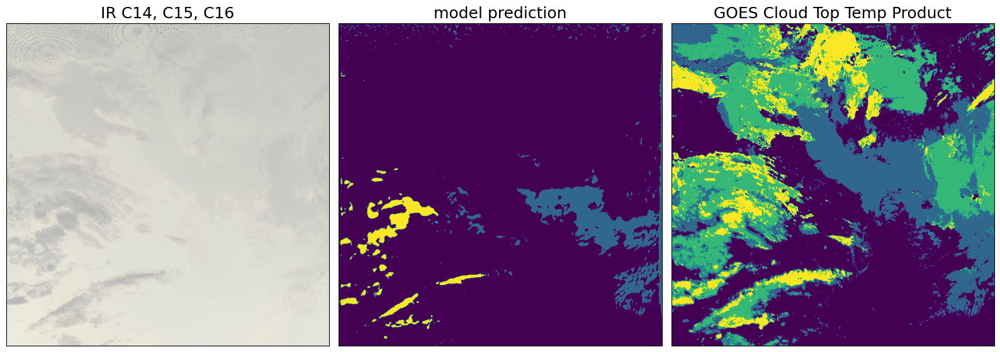

0.09000000357627869 IoU
---
G16_s20250562300206_e20250562309514_1_0.tif


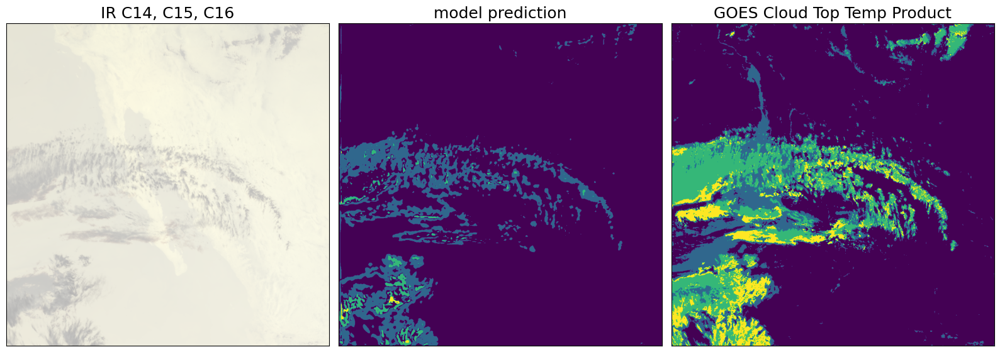

0.07000000029802322 IoU
---
G16_s20250562300206_e20250562309514_1_1.tif


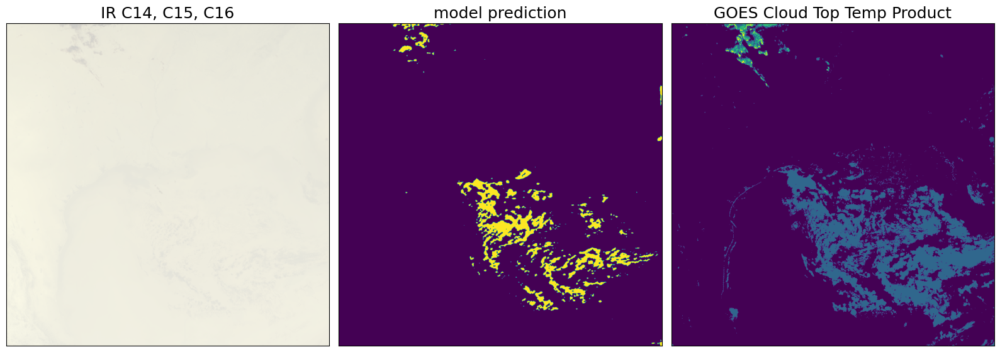

0.27000001072883606 IoU
---


In [34]:
#from result_plots import plot_test_results # 
for data in test_loader:
    batch_data, batch_labels, fn = data
    print(fn[0])
    batch_data, batch_labels = batch_data.to(device, dtype=torch.float), batch_labels.to(device, dtype=torch.float)
    pred = model(batch_data)
    pred = torch.sigmoid(pred)
    pred = (pred > 0.5) * 1
    plot_test_results(batch_data.squeeze(0),batch_labels.squeeze(0),pred.squeeze(0),fn[0],save_fig=True, data_loc='./cloud_data/')
    compute_iou(pred, batch_labels)
    print('---')


In [45]:
from result_plots import plot_test_results # 
for data in test_loader:
    batch_data, batch_labels, fn = data
    print(fn[0])
    batch_data, batch_labels = batch_data.to(device, dtype=torch.float), batch_labels.to(device, dtype=torch.float)
    pred = model(batch_data)
    pred = torch.sigmoid(pred)
    pred = (pred > 0.5) * 1
    plot_test_results(batch_data.squeeze(0),batch_labels.squeeze(0),pred.squeeze(0),fn[0],save_fig=True, data_loc='./data/')
    compute_iou(pred, batch_labels)


ModuleNotFoundError: No module named 'result_plots'

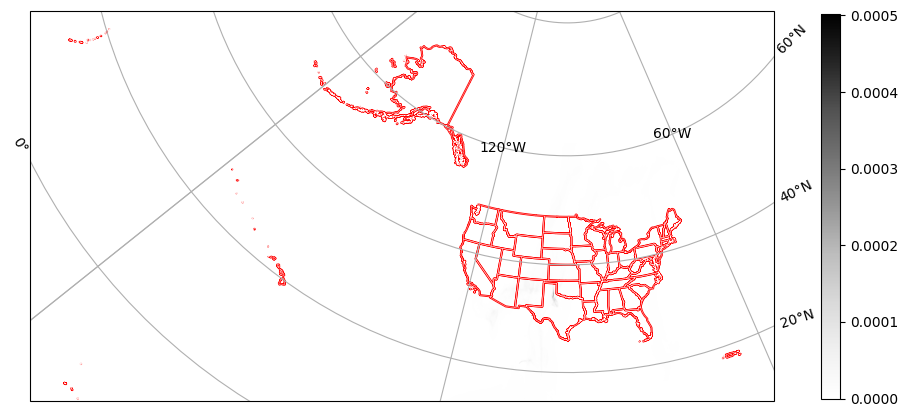

In [45]:
def plot_mass_den(mass_den):
    fig = plt.figure(figsize=(12,10))
    #ax = plt.axes(projection=projection)
    #img = ax.contourf(x, y, surface_tmp,250,vmin=min_tmp, vmax=max_tmp)
    proj = get_proj()
    ax = fig.add_subplot(1, 1, 1, projection=proj)
    states = get_states(proj)
    states.boundary.plot(ax=ax, edgecolor='red', linewidth=1.5)
    img = ax.imshow(mass_den, origin='lower', extent=(x[0], x[-1], y[0], y[-1]), cmap='Greys')
    #ax.coastlines())
    #ax.add_feature(cfeature.BORDERS)
    img.set_clim(min_tmp, max_tmp)
    states.boundary.plot(ax=ax, edgecolor='white', linewidth=.25)
    cb = plt.colorbar(img, shrink=0.5)
    ax.gridlines(draw_labels=True)
    plt.show()

plot_mass_den(mass_den)

In [39]:
hr = str(dt.hour).zfill(2)                                                                                                                               
day = str(dt.day).zfill(2)                                                                                                                               
mo = str(dt.month).zfill(2)                                                                                                                              
yr = str(dt.year)                                                                                                                                        
url = "s3://hrrrzarr/sfc/{}{}{}/{}{}{}_{}z_anl.zarr".format(yr,mo,day,yr,mo,day,hr)    

fs = s3fs.S3FileSystem(anon=True)
store = zarr.open(s3fs.S3Map(url, s3=fs))

mass_den = store["entire_atmosphere_single_layer/COLMD/entire_atmosphere_single_layer/COLMD"]

x  = store["entire_atmosphere_single_layer/COLMD/projection_x_coordinate"]
y = store["entire_atmosphere_single_layer/COLMD/projection_x_coordinate"]
print(mass_den.shape)
min_tmp = np.min(mass_den)
max_tmp = np.max(mass_den)

(1059, 1799)


In [163]:
dns = np.linspace(1,365,365)

In [164]:
dns

array([  1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,  11.,
        12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,  22.,
        23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,  33.,
        34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,  44.,
        45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,  55.,
        56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,  66.,
        67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,  77.,
        78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,  88.,
        89.,  90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,  99.,
       100., 101., 102., 103., 104., 105., 106., 107., 108., 109., 110.,
       111., 112., 113., 114., 115., 116., 117., 118., 119., 120., 121.,
       122., 123., 124., 125., 126., 127., 128., 129., 130., 131., 132.,
       133., 134., 135., 136., 137., 138., 139., 140., 141., 142., 143.,
       144., 145., 146., 147., 148., 149., 150., 15